# Lab on computer vision, Huawei-Polytech
### Mikov Aleksandr: sasha.mikoff@gmail.com

Our goal for this lab is to study the accuracy of geometric transformations. To do so **we have to**:
1. Transform the given images according to the given transform type:
   - similarity (translation, rotation & scaling - 4 degrees of freedom);
   - affine (6 degrees of freedom);
   - projective (8 degrees of freedom).
  
2. Apply the filtering technique to the transformed image, for example:
   - smoothing, or averaging, with different kernels;
   - gaussian blurring;
   - median blurring.
  
3. Detect and match features for the initial and transformed-filtered image.

4. Use the matched features to estimate the parameters of the geometric transform applied in step 1.
  

## Step 1

Download the image, apply the transform:

In [46]:
import urllib.request

# select your image
# img_url = 'https://www.dropbox.com/s/ovs2pe9tskpkn9e/k1.jpg?dl=1'
# img_url = 'https://www.dropbox.com/s/8n9ibp3uat6sya2/k2.jpg?dl=1'
img_url = 'https://www.dropbox.com/s/sc0bllv4380942k/k3.jpg?dl=1'

urllib.request.urlretrieve(img_url, 'image.jpg')

('image.jpg', <http.client.HTTPMessage at 0x1e59c1affd0>)

Now we get the trasform and apply it to the image, visually verifying the result. Your task here is to:
* define the transform in terms of its parameters (affine or projective);
* apply the transform to the image.

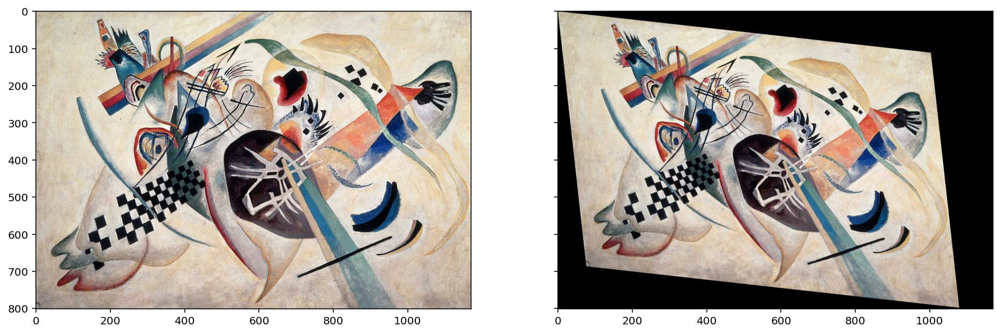

In [47]:
def get_transform(matrix):
    return matrix

def apply_transform(image, transform):
    return cv2.warpPerspective(image, transform, (image.shape[1], image.shape[0]))
    
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'

image = cv2.imread('image.jpg', cv2.IMREAD_COLOR)
image = np.flip(image, axis=-1)

h, w, _ = image.shape
matrix1 = np.array([[ 0.9,  0.1,  0.0],
                    [ 0.1,  0.9,  0.0],
                    [0.0, 0.0,  1.05]])

transform = get_transform(matrix1)

warped_image = cv2.warpPerspective(image, transform, (w, h))

fig, ax = plt.subplot_mosaic("oa", figsize = (16, 8), sharey=True)
ax['o'].imshow(image)
ax['a'].imshow(warped_image)

Now we apply the filter, for example, the gaussian blur.

Your task is to experiment with at least three different filters and select one of them for the next step.

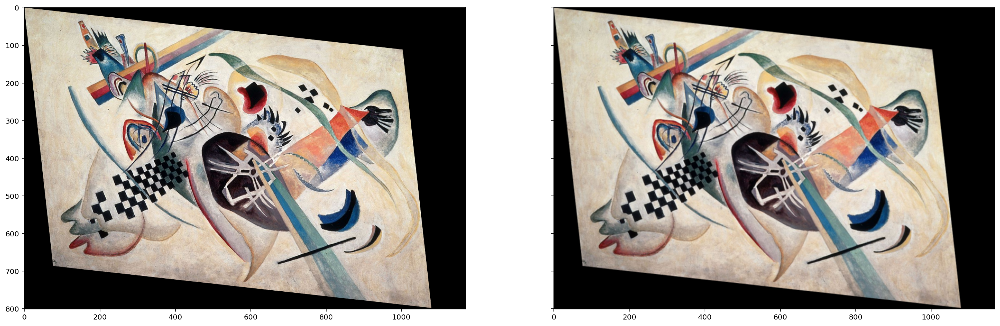

In [48]:
kernel_size = (3, 3)
std = 10

filtered_image = cv2.GaussianBlur(warped_image, kernel_size, std)
# filtered_image = cv2.boxFilter(warped_image, -1, kernel_size, normalize=True)
# filtered_image = cv2.medianBlur(warped_image, 7)

fig, ax = plt.subplot_mosaic("tf", figsize = (24, 8), sharey=True)
ax['t'].imshow(warped_image)
ax['f'].imshow(filtered_image)

## Step 3

Now let's detect the features on original and transformed images. Your task here is to:
* study the features that are available in OpenCV out of the box;
* extract the features from the images and visualize them;
* match the features using their descriptors, depending on the features used you can try brute-force, nearest-neighbour or any other matcher;
* then you should select the matcher that gives the best result for your transform type and filter;
* as a last step, you have to estimate the robustness of the matching while varying the parameters of transform (increasing them).

For the last step build four plots (1 and 2 on this step, 3 and 4 on the next):
1. The average distance for first N best matches depending on the intensity of the applied filter.
2. The number of matches depending on the intensity of the applied filter.
3. The average distance for first N best matches depending on the strength of the transform.
4. The number of matches depending on the strength of the transform.

Select the parameter N by yourself. What are your conclusions?
Is the feature detector & matcher robust to your transform and the filter?
What are the limits for its robustness?
Could you tell whether or not the matching is good judging by only these numbers?

intensity numbers dict_values([265, 206, 157, 76])
intensity distance dict_values([24.99, 29.0, 37.97, 59.421052631578945])

strength numbers dict_values([267, 189, 160, 142])
strength distance dict_values([25.5, 42.62, 55.41, 61.73])


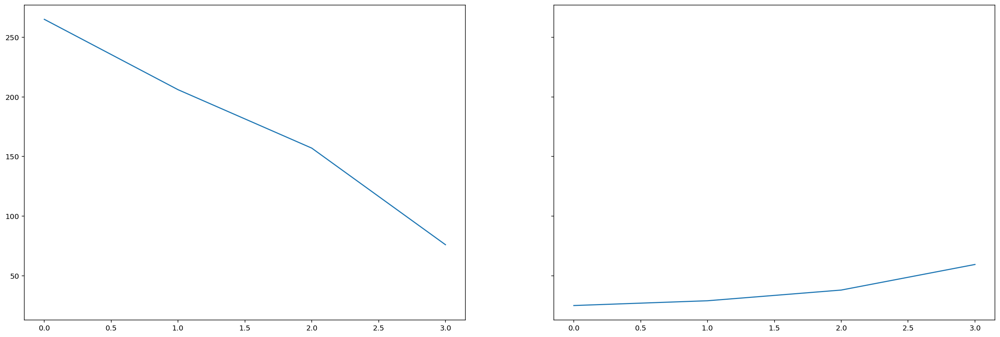

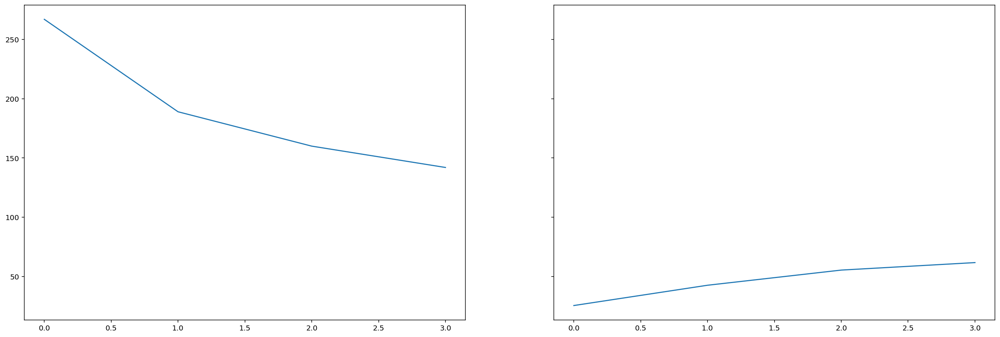

In [49]:
def match_images(image, filtered_image, ax = None):
    # select your own descriptor
    # descriptor = cv2.AKAZE_create()
    descriptor = cv2.ORB_create()

    kp1, des1 = descriptor.detectAndCompute(image, None)
    kp2, des2 = descriptor.detectAndCompute(filtered_image, None)

    # try different matchers
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    # bf = cv2.BFMatcher(cv2.NORM_HAMMING2, crossCheck=True)
    # bf = cv2.BFMatcher(cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)

    if ax:
        fig, ax = plt.subplots(1, 1, figsize = (11, 4))
        match_img = cv2.drawMatches(image, kp1, filtered_image, kp2, matches[:50], None)
        ax.imshow(match_img)

    return matches, kp1, kp2

# put your numbers to the filter parameters
kernel_sizes = (3, 11, 21, 41)

matrix_array = np.array([[[ 0.9,  0.1,  0.0],
                        [ 0.1,  0.9,  0.0],
                        [0.0, 0.0,  1.05]],
                       [[ 0.9,  0.2,  0.0],
                        [ 0.2,  0.9,  0.0],
                        [0.0, 0.0,  1.15]],
                       [[ 0.9,  0.3,  0.0],
                        [ 0.3,  0.9,  0.0],
                        [0.0, 0.0,  1.3]],
                       [[ 0.9,  0.4,  0.0],
                        [ 0.4,  0.9,  0.0],
                        [0.0, 0.0,  1.5]]])
N = 100

# dict to store the results to build the plot later
match_number, match_avg_distance = {}, {}
match_number_strength, match_avg_distance_strength = {}, {}

for i, kernel_size in enumerate(kernel_sizes):
    tmp_image = cv2.GaussianBlur(warped_image, (kernel_size, kernel_size), 0)
    # tmp_image = cv2.boxFilter(warped_image, -1, (kernel_size, kernel_size), normalize=True)
    # tmp_image = cv2.medianBlur(warped_image, kernel_size)

    # set last parameter to True to visualize the matches
    matches, _, _ = match_images(image, tmp_image, False)

    match_number[kernel_size] = len(matches)
    match_avg_distance[kernel_size] = np.mean([m.distance for m in matches][:N])

fig, ax = plt.subplot_mosaic("ot", figsize = (24, 8), sharey=True)

print("intensity numbers",match_number.values())
print("intensity distance",match_avg_distance.values())
print()

ax['o'].plot(match_number.values())
ax['t'].plot(match_avg_distance.values())

for i, matrix in enumerate(matrix_array):

    transform = get_transform(matrix)

    tmp_image2 = apply_transform(image, transform)
    # set last parameter to True to visualize the matches
    matches, _, _ = match_images(image, tmp_image2, False)

    match_number_strength[i] = len(matches)

    distance = [m.distance for m in matches][:N]
    match_avg_distance_strength[i] = np.mean(distance)

fig, ax = plt.subplot_mosaic("ot", figsize = (24, 8), sharey=True)

print("strength numbers",match_number_strength.values())
print("strength distance",match_avg_distance_strength.values())

ax['o'].plot(match_number_strength.values())
ax['t'].plot(match_avg_distance_strength.values())

При увеличении интенсивновти и силы фильтра количество совпадений уменьшается, а средняя дистанция увеличивается.

Опираясь на полученные числа сложно скзать насколько совпали картинки друг с другом.

## Step 4

Now we have to find the transform. As an example let's solve this problem for our similarity tranform and identify required parameters.

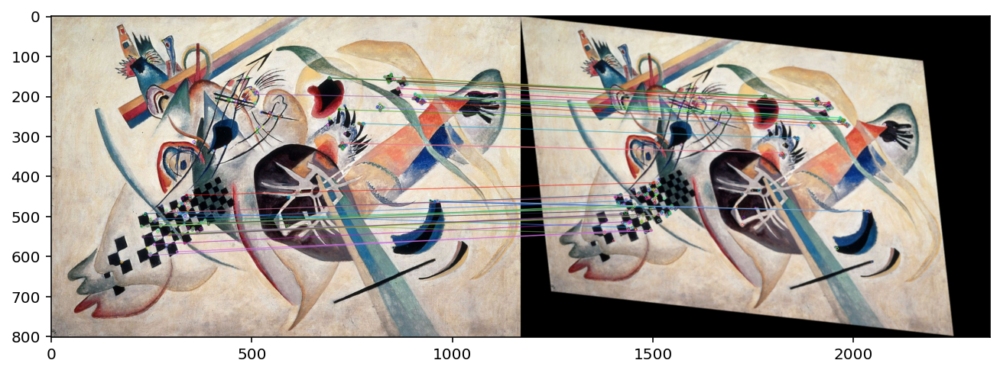

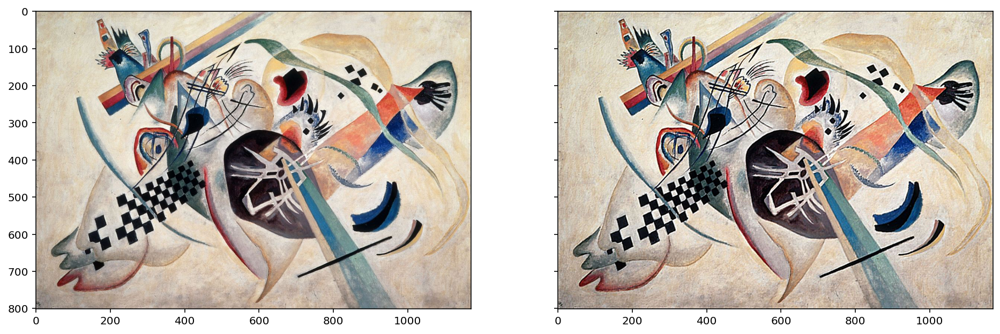

In [50]:
matches, kp1, kp2 = match_images(image, filtered_image, True)

# extract matched points coordinates
origin, destination = [], []
for m in matches:
    origin.append(kp1[m.queryIdx].pt)
    destination.append(kp2[m.trainIdx].pt)
    
origin = np.array(origin)
destination = np.array(destination)

# find the correct transform
transform_matrix, mask = cv2.findHomography(origin, destination, cv2.RANSAC, 5.0)

# search inverse transformation
inverse_transform = np.linalg.pinv(transform_matrix)

img_restored = cv2.warpPerspective(filtered_image, inverse_transform, (image.shape[1], image.shape[0]))

sharpen_kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
img_restored = cv2.filter2D(img_restored, -1, sharpen_kernel)

fig, ax = plt.subplot_mosaic("ot", figsize = (16, 8), sharey=True)
ax['o'].imshow(image)
ax['t'].imshow(img_restored)

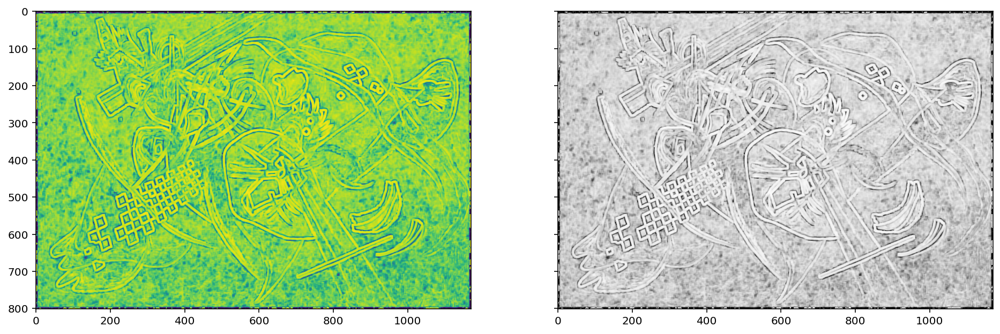

In [51]:
from skimage.metrics import structural_similarity as compare_ssim

def img_difference(imageA, imageB):
    # convert the images to grayscale
    grayA = cv2.cvtColor(imageA, cv2.COLOR_BGR2GRAY)
    grayB = cv2.cvtColor(imageB, cv2.COLOR_BGR2GRAY)

    # compute the Structural Similarity Index (SSIM) between the two
    # images, ensuring that the difference image is returned
    (score, diff) = compare_ssim(grayA, grayB, full=True)
    diff = (diff * 255).astype("uint8")
    gray_diff = cv2.merge([diff, diff, diff])

    thresh = cv2.threshold(diff, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)

    return diff, thresh, gray_diff

img_diff, _ , gray_diff = img_difference(image, img_restored)

fig, ax = plt.subplot_mosaic("dg", figsize = (16, 8), sharey=True)
ax['d'].imshow(img_diff)
ax['g'].imshow(gray_diff)

Now estimate the accuracy of the restored transform for different transformation levels (as we have done in **Step 3**). You can choose as the metric the difference of matrix norm or any other metric that you can find appropriate.

Полностью востановить картинку не удалось однало визуально картинка почти не откичается.

